# Capstone Project

## PGDP - ML : 18/19 batch

### Members

Mr. Karan Mitra
Mr. Prabhakaran
Mr. Devanandh

### Mentor

Ms. Sulekha Aloorravi

## Problem Definition

A house value is simply more than location and square footage. Like the features that make up a person, an educated party would want to know all aspects that give a house its value. For example, you want to sell a house and you don’t know the price which you can take — it can’t be too low or too high. To find house price you usually try to find similar properties in your neighbourhood and based on gathered data you will try to assess your house price. 

### Objective 

Take advantage of all of the feature variables available below, use it to analyse and predict house prices. 

1.	cid: a notation for a house
2.	dayhours: Date house was sold
3.	room_bed: Number of Bedrooms/House
4.	room_bath: Number of bathrooms/bedrooms
5.	living_measure: square footage of the home
6.	lot_measure: quare footage of the lot
7.	ceil: Total floors (levels) in house
8.	coast: House which has a view to a waterfront
9.	sight: Has been viewed
10.	condition: How good the condition is (Overall)
11.	quality: grade given to the housing unit, based on grading system
12.	ceil_measure: square footage of house apart from basement
13.	basement_measure: square footage of the basement
14.	yr_built: Built Year
15.	yr_renovated: Year when house was renovated
16.	zipcode: zip
17.	lat: Latitude coordinate
18.	long: Longitude coordinate
19.	living_measure15: Living room area in 2015(implies-- some renovations) This might or might not have affected the lotsize area
20.	lot_measure15: lotSize area in 2015(implies-- some renovations)
21.	furnished: Based on the quality of room

22: total_area: Measure of both living and lot

### Target Variable

price: Price is prediction target


In [1]:
#Basic libraries import

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.plotly as py
import plotly.graph_objs as go
%matplotlib inline
import plotly
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print (__version__) # requires version >= 1.9.0
init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings("ignore")

3.4.2


In [2]:
# Importing dataset

house_df = pd.read_csv('innercity.csv')

# EDA and Pre-processing (Feature Engineering and Selection)

In [3]:
# Viewing first 10 entries in the dataframe
house_df.head(10)

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3034200666,20141107T000000,808100,4,3.25,3020,13457,1.0,0,0,...,0,1956,0,98133,47.7174,-122.336,2120,7553,1,16477
1,8731981640,20141204T000000,277500,4,2.50,2550,7500,1.0,0,0,...,800,1976,0,98023,47.3165,-122.386,2260,8800,0,10050
2,5104530220,20150420T000000,404000,3,2.50,2370,4324,2.0,0,0,...,0,2006,0,98038,47.3515,-121.999,2370,4348,0,6694
3,6145600285,20140529T000000,300000,2,1.00,820,3844,1.0,0,0,...,0,1916,0,98133,47.7049,-122.349,1520,3844,0,4664
4,8924100111,20150424T000000,699000,2,1.50,1400,4050,1.0,0,0,...,0,1954,0,98115,47.6768,-122.269,1900,5940,0,5450
5,5525400430,20140715T000000,585000,3,2.50,2050,11690,2.0,0,0,...,0,1989,0,98059,47.5279,-122.161,2410,10172,1,13740
6,2419600075,20141201T000000,465000,3,1.75,1480,6360,1.0,0,0,...,0,1954,0,98133,47.7311,-122.353,1480,6360,0,7840
7,114101161,20140829T000000,480000,3,1.50,2100,67269,1.0,0,0,...,880,1949,0,98028,47.7592,-122.230,1610,15999,0,69369
8,7011201550,20140707T000000,780000,4,2.00,2600,4800,1.0,0,2,...,1200,1953,0,98119,47.6370,-122.371,2050,3505,0,7400
9,7203000640,20140918T000000,215000,4,1.00,1130,7400,1.0,0,0,...,0,1969,0,98003,47.3437,-122.316,1540,7379,0,8530


In [127]:
# analyzing the size of the dataframe and the variable datatypes
house_df.info()
df_size=house_df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
cid                 21613 non-null int64
dayhours            21613 non-null object
price               21613 non-null int64
room_bed            21613 non-null int64
room_bath           21613 non-null float64
living_measure      21613 non-null int64
lot_measure         21613 non-null int64
ceil                21613 non-null float64
coast               21613 non-null int64
sight               21613 non-null int64
condition           21613 non-null int64
quality             21613 non-null int64
ceil_measure        21613 non-null int64
basement            21613 non-null int64
yr_built            21613 non-null int64
yr_renovated        21613 non-null int64
zipcode             21613 non-null int64
lat                 21613 non-null float64
long                21613 non-null float64
living_measure15    21613 non-null int64
lot_measure15       21613 non-null int64
furnished           2

There are a total of 21613 data points. 

The input variables are all either integer or float datatype. 

The target variable(price) is of the datatype integer. 

Hence, we would look into regression based models to evaluate the integer target varible.

The "dayhours" column is of object type. Let's eyeball the data.



In [5]:
# Eyeballing dayhours column
house_df['dayhours'].head(5)

0    20141107T000000
1    20141204T000000
2    20150420T000000
3    20140529T000000
4    20150424T000000
Name: dayhours, dtype: object

The first 4digits quanitfy the year, the next 2 digits the month and the next 2 digits the date and the last 7 digits probably the time stamp. Hence, splitting this variable into respective variable groups

## 'Dayhours' data manipulation

In [6]:
# copying the source dataframe onto a new dataframe for manipulation
house_df_new=house_df.copy()

In [7]:
# creating a new column to mimic the timeframe
house_df_new['sold_date_full']=house_df_new['dayhours'].str[:8].astype('int64')

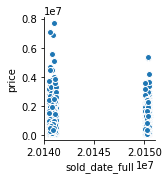

In [8]:
# Sold date versus price - Pairplot visualization
sns.pairplot(house_df_new,x_vars='sold_date_full',y_vars='price')

There are clusters forming up in the time series. Hence, let's split them up into indivdual features - date, month and year

In [9]:
# Creating separate features for sold date,month and year
house_df_new['sold_year']=house_df_new['dayhours'].str[:4].astype('int64')
house_df_new['sold_month']=house_df_new['dayhours'].str[4:6].astype('int64')
house_df_new['sold_date']=house_df_new['dayhours'].str[6:8].astype('int64')

In [10]:
# Evaluating feature - sold_year
house_df_new['sold_year'].head(5)

0    2014
1    2014
2    2015
3    2014
4    2015
Name: sold_year, dtype: int64

In [11]:
# evaluating feature - sold_month
house_df_new['sold_month'].head(5)

0    11
1    12
2     4
3     5
4     4
Name: sold_month, dtype: int64

In [12]:
# evaluating feature- sold_date
house_df_new['sold_date'].head(5)

0     7
1     4
2    20
3    29
4    24
Name: sold_date, dtype: int64

In [13]:
# having split the dayhours data, dropping the dayhours column from the dataframe

house_df_new=house_df_new.drop('dayhours',axis=1)

In [14]:
# looking into the new dataframe after dropping dayhours feature
house_df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 26 columns):
cid                 21613 non-null int64
price               21613 non-null int64
room_bed            21613 non-null int64
room_bath           21613 non-null float64
living_measure      21613 non-null int64
lot_measure         21613 non-null int64
ceil                21613 non-null float64
coast               21613 non-null int64
sight               21613 non-null int64
condition           21613 non-null int64
quality             21613 non-null int64
ceil_measure        21613 non-null int64
basement            21613 non-null int64
yr_built            21613 non-null int64
yr_renovated        21613 non-null int64
zipcode             21613 non-null int64
lat                 21613 non-null float64
long                21613 non-null float64
living_measure15    21613 non-null int64
lot_measure15       21613 non-null int64
furnished           21613 non-null int64
total_area          21

# Checking for missing values

In [15]:
# Check for NA values and count for each feature
house_df_new.isna().sum(axis=0)

cid                 0
price               0
room_bed            0
room_bath           0
living_measure      0
lot_measure         0
ceil                0
coast               0
sight               0
condition           0
quality             0
ceil_measure        0
basement            0
yr_built            0
yr_renovated        0
zipcode             0
lat                 0
long                0
living_measure15    0
lot_measure15       0
furnished           0
total_area          0
sold_date_full      0
sold_year           0
sold_month          0
sold_date           0
dtype: int64

There are no missing values in the dataset.

# Deliverable -1 (Exploratory data quality report reflecting the following)


# 1. Univariate analysis

Univariate analysis – data types and description of the independent attributes which should include (name, meaning, range of values observed, central values (mean and median), standard deviation and quartiles, analysis of the body of distributions / tails, missing values, outliers

In [16]:
# bird's eye view of the numerical distribution of the dataframe

house_df_new.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.401822e+05,3.673622e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
room_bed,21613.0,3.370842e+00,9.300618e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
room_bath,21613.0,2.114757e+00,7.701632e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
living_measure,21613.0,2.079900e+03,9.184409e+02,2.900000e+02,1.427000e+03,1.910000e+03,2.550000e+03,1.354000e+04
lot_measure,21613.0,1.510697e+04,4.142051e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068800e+04,1.651359e+06
ceil,21613.0,1.494309e+00,5.399889e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
coast,21613.0,7.541757e-03,8.651720e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
sight,21613.0,2.343034e-01,7.663176e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.409430e+00,6.507430e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


To get more clarity let's evalaute each variable separately

# Univariate Analysis 

### Check the input variable distribution and outliers 

# Bivariate Analysis

### Incase of outlier presence, evaluate importance through corelation analysis with target price

## Variable: CID -> A notation for the house

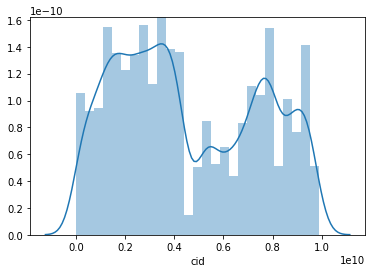

In [17]:
# Verifying the distribution and histogram of the variable

sns.distplot(house_df_new['cid'])


### Inference of distribution

There are two distinct distribution peaks in the column. Though this variable is used just as an identification variable, the histogram shows there are repeat/duplicate entries

In [18]:
# creation of a copy dataframe to evaluate the duplicates

house_df_f=house_df_new.copy()

# duplicate entry extraction

house_df_f['cid_id']=house_df_new['cid'].duplicated()

In [19]:
# size of the duplicate dataframe

house_df_f.loc[house_df_f['cid_id'] == True].shape

(177, 27)

There are a total of 177 duplicate entries in the dataframe. Let's look into the nature of the duplicates and check if they are really duplicates

In [20]:
# Listing the top 5 duplicate entries

house_df_f.loc[house_df_f['cid_id'] == True].sort_values(by='cid').head(5)

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,long,living_measure15,lot_measure15,furnished,total_area,sold_date_full,sold_year,sold_month,sold_date,cid_id
17038,1000102,280000,6,3.00,2400,9373,2.0,0,0,3,...,-122.214,2060,7316,0,11773,20140916,2014,9,16,True
19995,7200179,150000,2,1.00,840,12750,1.0,0,0,3,...,-122.211,1480,6969,0,13590,20141016,2014,10,16,True
17161,109200390,245000,3,1.75,1480,3900,1.0,0,0,4,...,-122.367,1830,6956,0,5380,20140820,2014,8,20,True
12964,123039336,148000,1,1.00,620,8261,1.0,0,0,3,...,-122.364,1180,8244,0,8881,20140611,2014,6,11,True
8544,251300110,225000,3,2.25,2510,12013,2.0,0,0,3,...,-122.314,1870,8017,0,14523,20140731,2014,7,31,True


In [21]:
# returning all instances of the first 5 duplicate entries

house_df_f.loc[house_df_f['cid'].isin(['1000102','7200179','109200390','123039336','251300110'])].sort_values(by='cid')

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,long,living_measure15,lot_measure15,furnished,total_area,sold_date_full,sold_year,sold_month,sold_date,cid_id
3405,1000102,300000,6,3.00,2400,9373,2.0,0,0,3,...,-122.214,2060,7316,0,11773,20150422,2015,4,22,False
17038,1000102,280000,6,3.00,2400,9373,2.0,0,0,3,...,-122.214,2060,7316,0,11773,20140916,2014,9,16,True
3874,7200179,175000,2,1.00,840,12750,1.0,0,0,3,...,-122.211,1480,6969,0,13590,20150424,2015,4,24,False
19995,7200179,150000,2,1.00,840,12750,1.0,0,0,3,...,-122.211,1480,6969,0,13590,20141016,2014,10,16,True
1727,109200390,250000,3,1.75,1480,3900,1.0,0,0,4,...,-122.367,1830,6956,0,5380,20141020,2014,10,20,False
17161,109200390,245000,3,1.75,1480,3900,1.0,0,0,4,...,-122.367,1830,6956,0,5380,20140820,2014,8,20,True
8438,123039336,244900,1,1.00,620,8261,1.0,0,0,3,...,-122.364,1180,8244,0,8881,20141208,2014,12,8,False
12964,123039336,148000,1,1.00,620,8261,1.0,0,0,3,...,-122.364,1180,8244,0,8881,20140611,2014,6,11,True
5441,251300110,358000,3,2.25,2510,12013,2.0,0,0,3,...,-122.314,1870,8017,0,14523,20150114,2015,1,14,False
8544,251300110,225000,3,2.25,2510,12013,2.0,0,0,3,...,-122.314,1870,8017,0,14523,20140731,2014,7,31,True


### Inference of duplicates:

There are certain repeated entries indicating the same property has been bought and resold, since there is no change in the other parameters. Hence, we are retaining them in the dataframe.

In [22]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['cid'],name='House property identifier',showlegend=True))]
plotly.offline.iplot(data)


In [214]:
# corelation of cid vs price
house_df_new['cid'].corr(house_df_new['price'])

-0.016797345163422024

### Inference of outliers

No outliers present in this variable. 

Note: This is an identification variable only, also implicated by no corelation with price, hence, this variable can be dropped for regression analysis.

## Variable room_bed -> No. of bedrooms/home

In [23]:
#evaluating the unique entries in the variable list

house_df_new['room_bed'].sort_values().unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 33], dtype=int64)

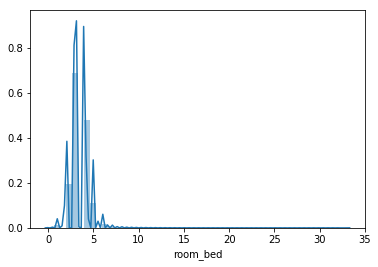

In [24]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['room_bed'])
plt.show()

### Inference of distribution

The data is right skewed indicating outliers, and also there are distinct peaks indicating clusters present in the dataframe

In [25]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['room_bed'],name='room_bed',showlegend=True))]
plotly.offline.iplot(data)


### Inference of outliers

The no. of rooms vary from 0 to 33. 

The outliers are present below 2 and above 5 as per the box plot. Outliers treatment is required here.

In [26]:
# Evaluating the outliers in number of bedrooms - Case A 

# case A

room_bed_outlier=house_df_new[(house_df_new.room_bed>5)|(house_df_new.room_bed<2)]
room_bed_outlier.shape

(546, 26)

In [212]:
# Case A corelation with price
room_bed_outlier['room_bed'].corr(house_df_new['price'])

0.34516796834918345

There are 546 entries with no. of bedrooms >5 and <2. It has a very low corelation with price. Let's check the number of entries with no. of bedrooms >5 and <1.

In [27]:
# Case B

room_bed_outlier_1=house_df_new[(house_df_new.room_bed>5)|(house_df_new.room_bed<1)]
room_bed_outlier_1.shape

(347, 26)

In [213]:
# Case B corelation with price
room_bed_outlier_1['room_bed'].corr(house_df_new['price'])

0.07117047300043448

There are 347 entries with no. of bedrooms >5 and <1. It has no corelation with price. Hence, we can remove them from the analysis dataframe. If more improvement to model accuracy is required, then Case A can be removed.

## Variable room_bath -> No. of bathrooms/bedroom

In [29]:
#evaluating the unique entries in the variable list

house_df_new['room_bath'].sort_values().unique()

array([0.  , 0.5 , 0.75, 1.  , 1.25, 1.5 , 1.75, 2.  , 2.25, 2.5 , 2.75,
       3.  , 3.25, 3.5 , 3.75, 4.  , 4.25, 4.5 , 4.75, 5.  , 5.25, 5.5 ,
       5.75, 6.  , 6.25, 6.5 , 6.75, 7.5 , 7.75, 8.  ])

In [30]:
# evaluating the number of unique entries
house_df_new['room_bath'].sort_values().unique().shape

(30,)

The no. of room_bath vary from 0 to 8 with a total of 30 unique entries and there are decimal values too. 

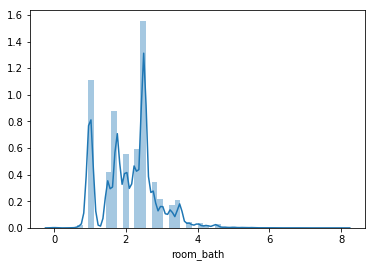

In [31]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['room_bath'])
plt.show()

### Inference of distribution

The data is right skewed indicating outliers, and also there are distinct peaks indicating clusters present in the dataframe

In [32]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['room_bath'],name='room_bath',showlegend=True))]
plotly.offline.iplot(data)

### Inference of suspected outliers

The outliers are present below 0.75 and above 3.5 as per the box plot. Outliers treatment is required here.

In [91]:
# creating outlier dataframe
room_bath_outlier=house_df_new[(house_df_new.room_bath>3.5)|(house_df_new.room_bath<0.75)]
room_bath_outlier.shape

(571, 26)

In [219]:
# corelation of no. of bathrooms/bedrooms with price
room_bath_outlier['room_bath'].corr(house_df_new['price'])

0.3971666095400386

There are 571 outlier entries and have moderate positive corelation only with price. Hence based on modelling accuracy we can decide if to retain or remove the outliers.

## Variable living_measure -> square footage of the home

In [34]:
#evaluating the unique entries in the variable list

house_df_new['living_measure'].sort_values().unique()

array([  290,   370,   380, ..., 10040, 12050, 13540], dtype=int64)

In [35]:
# evaluating the number of unique entries
house_df_new['living_measure'].sort_values().unique().shape

(1038,)

There are 1038 unique entries of living measure

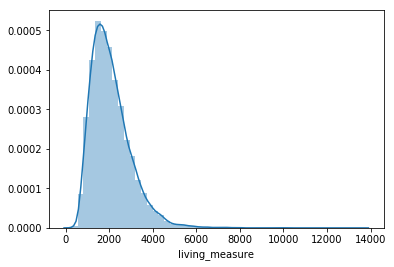

In [36]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['living_measure'])
plt.show()

### Inference of distribution

The data is normally distributed and it is right skewed indicating outliers.

In [37]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['living_measure'],name='living_measure',showlegend=True))]
plotly.offline.iplot(data)

### Inference of suspected outliers

The outliers are present above 4230 as per the box plot.

In [90]:
# creating outlier dataframe
living_measure_outlier=house_df_new[(house_df_new.living_measure>4230)]
living_measure_outlier.shape

(572, 26)

In [218]:
# corelation of living measure with price
living_measure_outlier['living_measure'].corr(house_df_new['price'])

0.5313679078718592

There are 572 outlier entries. Also they have moderate postivie corelation with price. Hence, decision to remove or retain need to be taken based on model accuracy.

## Variable lot_measure -> square footage of the lot

In [39]:
#evaluating the unique entries in the variable list

house_df_new['lot_measure'].sort_values().unique()

array([    520,     572,     600, ..., 1074218, 1164794, 1651359],
      dtype=int64)

In [40]:
# evaluating the number of unique entries
house_df_new['lot_measure'].sort_values().unique().shape

(9782,)

There are 9782 unique entries of lot measure

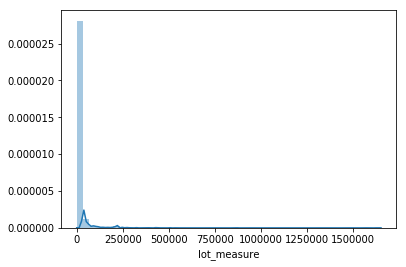

In [41]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['lot_measure'])
plt.show()

### Inference of distribution

The data is normally distributed and it is right skewed indicating outliers. The histogram shows an abnormaly high number of instances in the lot measures of smaller size, indicating maximum presence of such properties.

In [42]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['lot_measure'],name='lot_measure',showlegend=True))]
plotly.offline.iplot(data)

### Inference of suspected outliers

The outliers are present above 19141 as per the box plot.

In [89]:
# creating outlier dataframe
lot_measure_outlier=house_df_new[(house_df_new.lot_measure>19141)]
lot_measure_outlier.shape

(2425, 26)

In [221]:
# corelation of lot measure with price
lot_measure_outlier['lot_measure'].corr(house_df_new['price'])

-0.02223003352034574

There are 2425 outlier entries. They have no corelation with price. Hence, they can be removed from the analysis dataframe.

## Variable ceil -> Total floors in the house

In [92]:
#evaluating the unique entries in the variable list

house_df_new['ceil'].sort_values().unique()

array([1. , 1.5, 2. , 2.5, 3. , 3.5])

In [93]:
# evaluating the number of unique entries
house_df_new['ceil'].sort_values().unique().shape

(6,)

There are 6 unique entries of total floors in house. There are decimal entries too. 

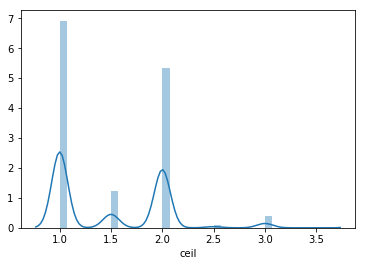

In [94]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['ceil'])
plt.show()

### Inference of distribution

The data has 4 peaks indicating 4 clusters. Maximum occurance in the histogram is 1 floor followed by 2 floors. The data is right skewed indicating outliers in the higher no.of floors.

In [95]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['ceil'],name='ceil',showlegend=True))]
plotly.offline.iplot(data)

### Inference of suspected outliers

Contrary to the inference of distribution plot, there are no outliers in the no. of floors in box plot. Hence, no outlier treatment required.

## Variable coast -> If the property is near a waterbody

In [102]:
#evaluating the unique entries in the variable list

house_df_new['coast'].sort_values().unique()

array([0, 1], dtype=int64)

In [103]:
# evaluating the number of unique entries
house_df_new['coast'].sort_values().unique().shape

(2,)

This variable is of categorical type indicating if the property is facing a waterbody or not.

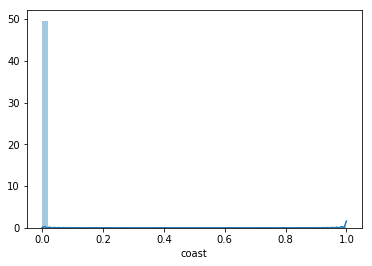

In [104]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['coast'])
plt.show()

### Inference of distribution

The data is extremely right skewed. The histogram shows an abnormaly high number of instances of the properties without facing a waterbody.

In [118]:
# Number of houses not facing waterbody
coast_no=house_df_new[house_df_new.coast==0].shape
coast_no[0]

21450

In [119]:
# Number of houses facing waterbody
coast_yes=house_df_new[house_df_new.coast==1].shape
coast_yes[0]

163

In [146]:
# Percentage of houses facing waterbody
print ('%3.2f'%(coast_yes[0]/df_size[0]*100),'%')

0.75 %


The data shows only 163 houses are facing a waterbody, while the remaining is not. That is only 0.75% of the total houses are facing the waterbody.

In [78]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['furnished'],name='Furnished',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

As the number of houses facing waterbody are only 0.75% of the total population in the database, they have been marked as outliers. Hence, let's evaluate the impact of facing waterbody against the price.

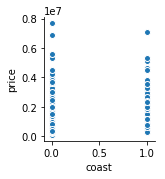

In [150]:
# Waterbody facing status versus price - Pairplot visualization
sns.pairplot(house_df_new,x_vars='coast',y_vars='price')

In [151]:
# Furnished status versus price - Correlation analysis
house_df_new['coast'].corr(house_df_new['price'])

0.26633051052225637

The variable furnished has a low corelation with the target price. Also, as the population of this sample is low, we can remove them from analysis.

In [153]:
# creating outlier dataframe
coast_outlier=house_df_new[(house_df_new.coast==1)]
coast_outlier.shape

(163, 26)

## Variable sight -> If the property has been viewed

In [154]:
#evaluating the unique entries in the variable list

house_df_new['sight'].sort_values().unique()

array([0, 1, 2, 3, 4], dtype=int64)

In [155]:
# evaluating the number of unique entries
house_df_new['sight'].sort_values().unique().shape

(5,)

This variable is of categorical type indicating how many times the property has been viewed. 0 indicates the property has not been viewed earlier, while maximum number of views is 4.

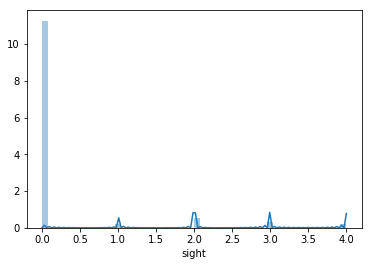

In [156]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['sight'])
plt.show()

### Inference of distribution

The data is extremely right skewed. The histogram shows an abnormaly high number of instances of the properties without previous viewings.

In [159]:
# Number of houses not viewed previously : Case C0
sight_no=house_df_new[house_df_new.sight==0].shape
sight_no[0]

19489

In [166]:
# Number of houses previously viewed once : Case C1
sight_once=house_df_new[house_df_new.sight==1].shape
sight_once[0]

332

In [162]:
# Number of houses previously viewed twice : Case C2
sight_twice=house_df_new[house_df_new.sight==2].shape
sight_twice[0]

963

In [163]:
# Number of houses previously viewed thrice : Case C3
sight_thrice=house_df_new[house_df_new.sight==3].shape
sight_thrice[0]

510

In [164]:
# Number of houses previously viewed fourtimes : Case C4
sight_four=house_df_new[house_df_new.sight==4].shape
sight_four[0]

319

In [168]:
# No. of houses viewed previously
print (sight_once[0]+sight_twice[0]+sight_thrice[0]+sight_four[0])

2124


In [167]:
# Percentage of houses viewed previously
print ('%3.2f'%((sight_once[0]+sight_twice[0]+sight_thrice[0]+sight_four[0])/df_size[0]*100),'%')

9.83 %


The data shows only 2164 houses were viewed previously accounting for 9.83% of the total house population.This is a signifant number. Hence, the impact of pricing needs to be evaulated for decision on outlier treatment.

In [157]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['sight'],name='sight',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

As the number of houses viewed previously are only 9.83% of the total population in the database, they have been marked as outliers. Hence, let's evaluate the impact of property viewed previously against the price.

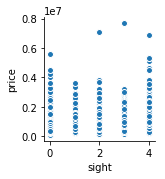

In [170]:
# House previously viewed status versus price - Pairplot visualization
sns.pairplot(house_df_new,x_vars='sight',y_vars='price')

In [171]:
# House previously viewed status versus price - Correlation analysis
house_df_new['sight'].corr(house_df_new['price'])

0.3973464743789392

The variable furnished has a low corelation with the target price. However, the call to remove or retain them can be taken based on modelling accuracy since they the number of entities are of sizeable number

In [172]:
# creating outlier dataframe
sight_outlier=house_df_new[(house_df_new.sight>0)]
sight_outlier.shape

(2124, 26)

## Variable condition -> How good the condition is (Overall)

In [173]:
#evaluating the unique entries in the variable list

house_df_new['condition'].sort_values().unique()

array([1, 2, 3, 4, 5], dtype=int64)

In [174]:
# evaluating the number of unique entries
house_df_new['condition'].sort_values().unique().shape

(5,)

This variable is of categorical type indicating the overall condition of the property with value ranging from 1 to 5. Probably 1 indicating poor condition and 5 indicating very good condition.  

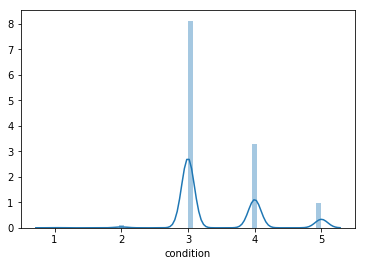

In [175]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['condition'])
plt.show()

### Inference of distribution

The data has three peaks. With the mean rating of 3 the maximum number of the occurances, the distribution is centrally spread. 

In [176]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['condition'],name='condition',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

The boxplot shows that the condition 1 is an outlier. Let's quantify the number of instances of condition 1.

In [222]:
# creating outlier dataframe
condition_outlier=house_df_new[(house_df_new.condition==1)]
condition_outlier.shape

(30, 26)

There are only 30 outlier entitites. Let us remove them from the analysis dataframe.

## Variable quality -> grade given to the housing unit, based on grading system

In [179]:
#evaluating the unique entries in the variable list

house_df_new['quality'].sort_values().unique()

array([ 1,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13], dtype=int64)

In [180]:
# evaluating the number of unique entries
house_df_new['quality'].sort_values().unique().shape

(12,)

This variable is of categorical type indicating the grade of the property with value ranging from 1 to 13. 

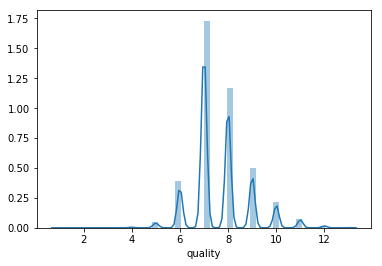

In [181]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['quality'])
plt.show()

### Inference of distribution

The data has 7 peaks. With the mean rating of 7 the maximum number of the occurances, the distribution is centrally spread. 

In [182]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['quality'],name='quality',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

The boxplot shows that the quality <6 and >9 are outliers. Let's quantify the number outlier instances.

In [184]:
# creating outlier dataframe
quality_outlier=house_df_new[(house_df_new.quality<6)|(house_df_new.quality>9)]
quality_outlier.shape

(1911, 26)

There are 1911 outlier entitites. Let us look into the respective corelation with price.

In [223]:
# correlation of quality with price
quality_outlier['quality'].corr(house_df_new['price'])

0.5804696076433611

The outlier variables have a moderate positive corelation with price. Hence, based on model accuracy the decision to remove or retain the outliers can be made

## Variable ceil_measure -> square footage apart from basement

In [188]:
#evaluating the unique entries in the variable list

house_df_new['ceil_measure'].sort_values().unique()

array([ 290,  370,  380,  384,  390,  410,  420,  430,  440,  460,  470,
        480,  490,  500,  520,  530,  540,  550,  560,  570,  580,  590,
        600,  610,  620,  630,  640,  650,  660,  670,  680,  690,  700,
        710,  720,  730,  740,  750,  760,  765,  770,  780,  790,  798,
        800,  806,  809,  810,  820,  828,  830,  833,  840,  844,  850,
        860,  866,  870,  880,  890,  893,  894,  900,  901,  902,  910,
        920,  930,  940,  944,  950,  960,  962,  963,  970,  980,  988,
        990,  992,  995,  998, 1000, 1002, 1008, 1010, 1020, 1030, 1040,
       1048, 1050, 1060, 1061, 1068, 1070, 1072, 1076, 1078, 1080, 1084,
       1087, 1088, 1090, 1092, 1094, 1095, 1100, 1105, 1108, 1110, 1116,
       1120, 1122, 1129, 1130, 1131, 1140, 1144, 1150, 1159, 1160, 1165,
       1170, 1175, 1180, 1190, 1200, 1210, 1212, 1216, 1220, 1230, 1232,
       1239, 1240, 1248, 1250, 1255, 1256, 1260, 1264, 1270, 1275, 1280,
       1288, 1290, 1295, 1296, 1300, 1310, 1313, 13

In [189]:
# evaluating the number of unique entries
house_df_new['ceil_measure'].sort_values().unique().shape

(946,)

There are 946 unique entries in the variable

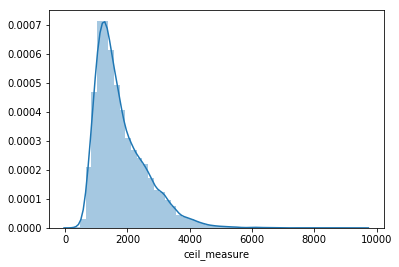

In [190]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['ceil_measure'])
plt.show()

### Inference of distribution

The data is normally distributed with moderate right skewedness indicating presence of outliers in high ceil measures.

In [191]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['ceil_measure'],name='ceil_measure',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

The boxplot shows that ceil measure > 3740 are outliers. Let's quantify the number of instances.

In [192]:
# creating outlier dataframe
ceil_measure_outlier=house_df_new[(house_df_new.ceil_measure>3740)]
ceil_measure_outlier.shape

(611, 26)

In [224]:
# corelation of ceil_measure with price

ceil_measure_outlier['ceil_measure'].corr(house_df_new['price'])

0.5225527924264771

There are 611 outlier entitites and they have moderate positive corelation with price. Hence, based on model accuracy we can choose to remove or retain them.

## Variable basement -> square footage of basement

In [195]:
#evaluating the unique entries in the variable list

house_df_new['basement'].sort_values().unique()

array([   0,   10,   20,   40,   50,   60,   65,   70,   80,   90,  100,
        110,  120,  130,  140,  143,  145,  150,  160,  170,  172,  176,
        180,  190,  200,  207,  210,  220,  225,  230,  235,  240,  243,
        248,  250,  260,  265,  266,  270,  274,  276,  280,  283,  290,
        295,  300,  310,  320,  330,  340,  350,  360,  370,  374,  380,
        390,  400,  410,  414,  415,  417,  420,  430,  435,  440,  450,
        460,  470,  475,  480,  490,  500,  506,  508,  510,  515,  516,
        518,  520,  530,  540,  550,  556,  560,  570,  580,  588,  590,
        600,  602,  610,  620,  630,  640,  650,  652,  660,  666,  670,
        680,  690,  700,  704,  710,  720,  730,  740,  750,  760,  768,
        770,  780,  784,  790,  792,  800,  810,  820,  830,  840,  850,
        860,  861,  862,  870,  875,  880,  890,  894,  900,  906,  910,
        915,  920,  930,  935,  940,  946,  950,  960,  970,  980,  990,
       1000, 1008, 1010, 1020, 1024, 1030, 1040, 10

In [196]:
# evaluating the number of unique entries
house_df_new['basement'].sort_values().unique().shape

(306,)

There are 306 unique entries in the variable

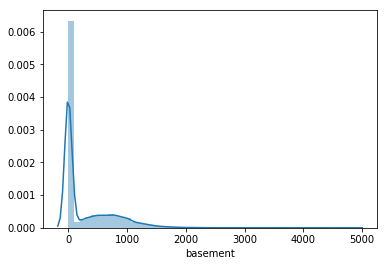

In [197]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['basement'])
plt.show()

### Inference of distribution

The data has two peaksright skewedness indicating presence of outliers in high basement measures. Also histogram indicates that most of the houses do not have basement.

In [198]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['basement'],name='basement',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

The boxplot shows that basement measures > 1400 are outliers. Let's quantify the number of instances.

In [199]:
# creating outlier dataframe
basement_outlier=house_df_new[(house_df_new.basement>1400)]
basement_outlier.shape

(496, 26)

In [226]:
# corelation of basement size with price

basement_outlier['basement'].corr(house_df_new['price'])

0.43521614552326165

There are 496 outlier entitites and they have a moderate positive corelation with price. Hence, based on modelling accuracy let's take a call to remove or retain them.

## Variable yr_built-> Built year

In [200]:
#evaluating the unique entries in the variable list

house_df_new['yr_built'].sort_values().unique()

array([1900, 1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1909, 1910,
       1911, 1912, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921,
       1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932,
       1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943,
       1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965,
       1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976,
       1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987,
       1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998,
       1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009,
       2010, 2011, 2012, 2013, 2014, 2015], dtype=int64)

In [201]:
# evaluating the number of unique entries
house_df_new['yr_built'].sort_values().unique().shape

(116,)

There are 116 unique entries in the variable. The earliest built house is in 1900 while the latest being built in 2015.

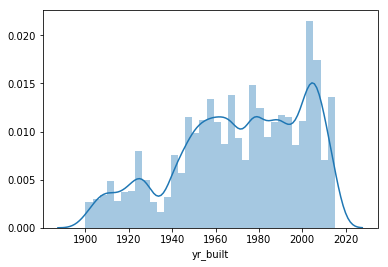

In [202]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['yr_built'])
plt.show()

### Inference of distribution

The data shows that the houses being built were following an increase in trend from 1900 and peaking in the 2000s. 

In [203]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['yr_built'],name='yr_built',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

The boxplot shows there are no outliers in the data.

## Variable yr_renovated -> Renovated year

In [204]:
#evaluating the unique entries in the variable list

house_df_new['yr_renovated'].sort_values().unique()

array([   0, 1934, 1940, 1944, 1945, 1946, 1948, 1950, 1951, 1953, 1954,
       1955, 1956, 1957, 1958, 1959, 1960, 1962, 1963, 1964, 1965, 1967,
       1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978,
       1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989,
       1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000,
       2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011,
       2012, 2013, 2014, 2015], dtype=int64)

In [205]:
# evaluating the number of unique entries
house_df_new['yr_renovated'].sort_values().unique().shape

(70,)

There are 70 unique entries in the variable. '0' would be typically refering that the property was not renovated.

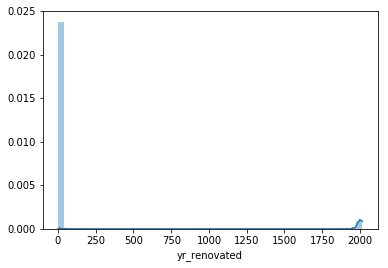

In [206]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['yr_renovated'])
plt.show()

### Inference of distribution

The data has two inferences. One being that most of the houses are not renovated. The second being that the renovations followed were mostly in the 2000s.

In [207]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['yr_renovated'],name='yr_renovated',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

The boxplot shows that all the renovations being an outlier. Let's look into the number of such instances.

In [208]:
# creating outlier dataframe
yr_renovated_outlier=house_df_new[(house_df_new.yr_renovated>0)]
yr_renovated_outlier.shape

(914, 26)

There are 914 outlier entitites. Let us look into its corelation with price to decide on whether to remove them or not from the analysis dataframe.

In [225]:
# corelation of yr_renovated with price
yr_renovated_outlier['yr_renovated'].corr(house_df_new['price'])

0.12792638428182113

The corelation with price is very low. Hence, we can remove them from the analysis dataframe

## Variable zipcode -> Property Zipcode

In [44]:
#evaluating the unique entries in the variable list

house_df_new['zipcode'].sort_values().unique()

array([98001, 98002, 98003, 98004, 98005, 98006, 98007, 98008, 98010,
       98011, 98014, 98019, 98022, 98023, 98024, 98027, 98028, 98029,
       98030, 98031, 98032, 98033, 98034, 98038, 98039, 98040, 98042,
       98045, 98052, 98053, 98055, 98056, 98058, 98059, 98065, 98070,
       98072, 98074, 98075, 98077, 98092, 98102, 98103, 98105, 98106,
       98107, 98108, 98109, 98112, 98115, 98116, 98117, 98118, 98119,
       98122, 98125, 98126, 98133, 98136, 98144, 98146, 98148, 98155,
       98166, 98168, 98177, 98178, 98188, 98198, 98199], dtype=int64)

In [45]:
# evaluating the number of unique entries
house_df_new['zipcode'].sort_values().unique().shape

(70,)

There are 70 unique zipcode entries in the dataset. On looking up the zipcodes, these are located in Seattle, Washington in the USA.

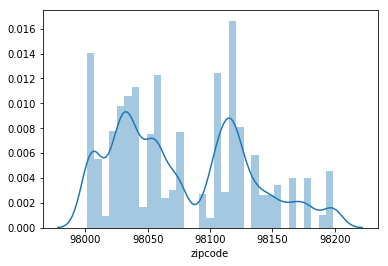

In [46]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['zipcode'])
plt.show()

### Inference of distribution

There are multiple peaks indicating clusters present in the data. Almost all zipcodes have multiple entries, indicating multiple house properties in a given area. 

In [47]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['zipcode'],name='zipcode',showlegend=True))]
plotly.offline.iplot(data)

### Inference of outliers

There are no outliers present in the dataset.

## Variable lat -> Property latitude

In [48]:
#evaluating the unique entries in the variable list

house_df_new['lat'].sort_values().unique()

array([47.1559, 47.1593, 47.1622, ..., 47.7774, 47.7775, 47.7776])

In [49]:
# evaluating the number of unique entries
house_df_new['lat'].sort_values().unique().shape

(5034,)

There are 5034 unique latitude entries in the dataset. 

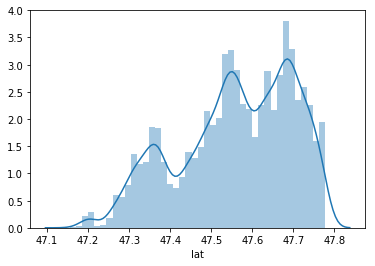

In [50]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['lat'])
plt.show()

### Inference of distribution

There are three distinct peaks indicating 3 prominent latitude clusters present in the data. 

In [51]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['lat'],name='lat',showlegend=True))]
plotly.offline.iplot(data)

### Inference of suspected outliers

As per boxplot, latitudes < 47.1622 are outliers. And thus there are two outliers present in the dataset. Let's us look in conjection with longitude details to check if they are truly outliers.

## Suspected Outlier Verification - Latitude

In [52]:
# printing all rows with suspected outliers in Latitude and checking against longitude and zipcode

house_df_new[house_df_new.lat<47.1622][['lat','long','zipcode']]

,lat,long,zipcode
2815,47.1559,-121.646,98022
8186,47.1593,-121.957,98022


### Outlier Conclusion

The suspected latitude coordinates were verified along with the respective longitudes and were matching to the zipcode provided. Hence, they are not cases of mis-entry and thus these data points would be retained in the dataset.

#### Online verification of co-ordinates

https://www.melissa.com/v2/lookups/latlngzip4/index?lat=47.1559&lng=-121.646

https://www.melissa.com/v2/lookups/latlngzip4/index?lat=47.1593&lng=-121.957

## Variable long -> Property longitude

In [53]:
#evaluating the unique entries in the variable list

house_df_new['long'].sort_values().unique()

array([-122.519, -122.515, -122.514, -122.512, -122.511, -122.509,
       -122.507, -122.506, -122.505, -122.504, -122.503, -122.502,
       -122.499, -122.497, -122.496, -122.491, -122.49 , -122.486,
       -122.484, -122.482, -122.479, -122.475, -122.474, -122.473,
       -122.472, -122.47 , -122.469, -122.467, -122.465, -122.464,
       -122.463, -122.462, -122.461, -122.46 , -122.459, -122.458,
       -122.457, -122.456, -122.455, -122.454, -122.453, -122.452,
       -122.451, -122.45 , -122.449, -122.448, -122.447, -122.446,
       -122.445, -122.444, -122.443, -122.441, -122.44 , -122.439,
       -122.438, -122.435, -122.433, -122.432, -122.431, -122.43 ,
       -122.425, -122.422, -122.421, -122.42 , -122.416, -122.415,
       -122.414, -122.413, -122.412, -122.411, -122.41 , -122.409,
       -122.408, -122.407, -122.406, -122.405, -122.404, -122.403,
       -122.402, -122.401, -122.4  , -122.399, -122.398, -122.397,
       -122.396, -122.395, -122.394, -122.393, -122.392, -122.

In [54]:
# evaluating the number of unique entries
house_df_new['long'].sort_values().unique().shape

(752,)

There are 752 unique longitude entries in the dataset. 

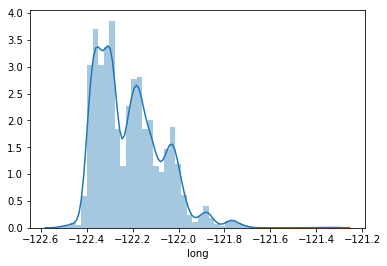

In [55]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['long'])
plt.show()

### Inference of distribution

There are five distinct peaks indicating 5 prominent longitude clusters present in the data. 

In [56]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['long'],name='long',showlegend=True))]
plotly.offline.iplot(data)

### Inference of suspected outliers

As per boxplot, all values greater that -121.821 are marked as outliers. Let's evaluate them along with latitude to check if they are truly outliers.

## Suspected Outlier Verification - Latitude

In [97]:
# printing all rows with suspected outliers in Latitude and checking against longitude and zipcode

long_outlier=house_df_new[house_df_new.long>-121.821]

long_outlier.shape

(256, 26)

There are a total of 256 suspected outliers in longitude

In [98]:
# verifying unique pincodes of the suspected longitude outliers

long_outlier['zipcode'].unique()

array([98045, 98019, 98065, 98014, 98022], dtype=int64)

### Evaluating one such coordinate in the uszipcode database to check the correctness of the longitude

ID: 21514 Lat: 47.4834 Long: -121.773 Zipcode: 98045

In [99]:
#!pip install uszipcode  #to install the uszipcode package

In [100]:
# using the SearchEngine module in the uszipcode package

from uszipcode import SearchEngine 
search = SearchEngine(simple_zipcode=True) #import only simple_zipcode package (9mb)

In [101]:
# Employing reverse Geocoding to evaluate the zipcode for the input lat and long
res=search.by_coordinates(47.4834,-121.773,radius=10,returns=0)
for i in range(len(res)):
    print(res[i].zipcode)

98024
98065
98038
98014


In [227]:
# corelation of longitude with price

long_outlier['long'].corr(house_df_new['price'])

-0.1715302115557192

### Outlier inference

For this lat and long, the zipcode in the US database is not matching with the entries in our house database. Also, there is no correlation with price, hence, we'll remove them from the analysis dataframe.


## Variable living_measure15 -> If living measure in 2015 (denotes some renovations)

In [62]:
#evaluating the unique entries in the variable list

house_df_new['living_measure15'].sort_values().unique()

array([ 399,  460,  620,  670,  690,  700,  710,  720,  740,  750,  760,
        770,  780,  790,  800,  806,  810,  820,  828,  830,  840,  850,
        860,  870,  880,  890,  900,  910,  920,  930,  940,  950,  952,
        960,  970,  980,  990,  998, 1000, 1010, 1020, 1030, 1040, 1050,
       1056, 1060, 1070, 1076, 1078, 1080, 1084, 1088, 1090, 1092, 1098,
       1100, 1110, 1120, 1125, 1128, 1130, 1131, 1132, 1137, 1138, 1140,
       1150, 1156, 1160, 1162, 1168, 1170, 1175, 1180, 1188, 1190, 1200,
       1210, 1216, 1217, 1220, 1228, 1230, 1232, 1240, 1250, 1256, 1260,
       1264, 1268, 1270, 1277, 1280, 1282, 1285, 1290, 1295, 1300, 1302,
       1303, 1304, 1307, 1309, 1310, 1320, 1321, 1326, 1330, 1336, 1340,
       1346, 1350, 1352, 1356, 1357, 1358, 1360, 1364, 1365, 1369, 1370,
       1377, 1380, 1381, 1390, 1398, 1399, 1400, 1404, 1405, 1408, 1410,
       1414, 1415, 1420, 1425, 1427, 1429, 1430, 1439, 1440, 1442, 1443,
       1445, 1448, 1450, 1458, 1459, 1460, 1463, 14

In [63]:
# evaluating the number of unique entries
house_df_new['living_measure15'].sort_values().unique().shape

(777,)

There are 777 unique renovated living measure entries in the dataset.

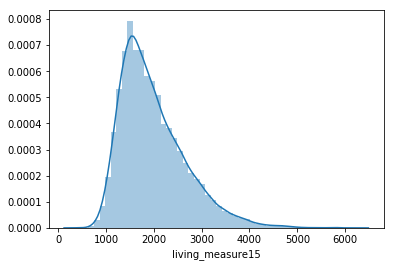

In [64]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['living_measure15'])
plt.show()

### Inference of distribution

The data has a normal distribution with only one peak. The distribution is slightly right skewed, indicating a possibility of outliers.

In [65]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['living_measure15'],name='Living measure renovated in 2015',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

As per boxplot, values > 3660 suggests suspected outliers.

In [66]:
# creating outlier dataframe
liv_meas15_outlier=house_df_new[(house_df_new.living_measure15>3660)]
liv_meas15_outlier.shape

(544, 26)

In [228]:
# correlation of living measure (2015) with price

liv_meas15_outlier['living_measure15'].corr(house_df_new['price'])

0.16931321625308454

There are 544 outlier entries. They have no corelation with price. Hence, they can be removed from the analysis dataframe

## Variable lot_measure15 -> Lot measure in 2015 

In [67]:
#evaluating the unique entries in the variable list

house_df_new['lot_measure15'].sort_values().unique()

array([   651,    659,    660, ..., 560617, 858132, 871200], dtype=int64)

In [68]:
# evaluating the number of unique entries
house_df_new['lot_measure15'].sort_values().unique().shape

(8689,)

There are 8689 unique renovated lot measure entries in the dataset.

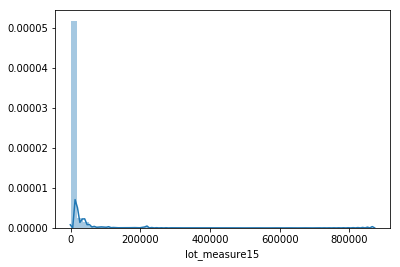

In [69]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['lot_measure15'])
plt.show()

### Inference of distribution

The data has two peaks indicating two clusters. The histogram shows an abnormaly high number of instances in the lot measures of smaller size, indicating maximum presence of such properties. Also, the data is extremely right skewed indicating presence of outliers.

In [70]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['lot_measure15'],name='Lot measure in 2015',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

As per boxplot, values > 17.55k suggests suspected outliers.

In [71]:
# creating outlier dataframe
lot_meas15_outlier=house_df_new[(house_df_new.lot_measure15>17550)]
lot_meas15_outlier.shape

(2194, 26)

In [229]:
# correlation of lot measure(2015) with price

lot_meas15_outlier['lot_measure15'].corr(house_df_new['price'])

-0.0863866967458371

There are 2194 outlier entries. And they have no corelation with price. Hene, they can be removed from the analysis dataframe.

## Variable Furnished -> Based on the quality of room 

In [72]:
#evaluating the unique entries in the variable list

house_df_new['furnished'].sort_values().unique()

array([0, 1], dtype=int64)

In [73]:
# evaluating the number of unique entries
house_df_new['furnished'].sort_values().unique().shape

(2,)

This variable is a categorical variable indicating if the room has been furnished or not

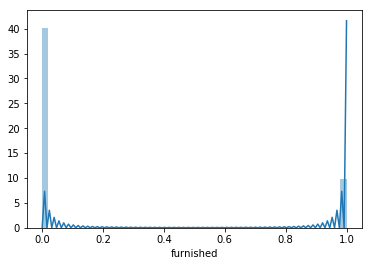

In [74]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['furnished'])
plt.show()

### Inference of distribution

As the data is categorical, distribution cannot be quanitfied. But based on the histogram, we can see that only a few entities are furnished, while the rest are unfurnished.

In [147]:
# Number of unfurnished houses
furn_no=house_df_new[house_df_new.furnished==0].shape
furn_no[0]

17362

In [148]:
# Number of furnished houses
furn_yes=house_df_new[house_df_new.furnished==1].shape
furn_yes[0]

4251

In [149]:
# Percentage of Furnished houses
print ('%3.2f'%(furn_yes[0]/df_size[0]*100),'%')

19.67 %


The data shows only 4251 houses are furnished, while the remaining is unfurnished. That is only 19.67% of the houses are furnished.

In [78]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['furnished'],name='Furnished',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

As the number of furnished houses are only 19.67 % of the total population in the database, they have been marked as outliers. Hence, let's evaluate the impact of furnishing against the price.

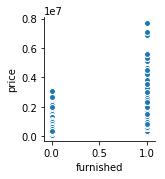

In [79]:
# Furnished status versus price - Pairplot visualization
sns.pairplot(house_df_new,x_vars='furnished',y_vars='price')

In [80]:
# Furnished status versus price - Correlation analysis
house_df_new['furnished'].corr(house_df_new['price'])

0.5659906587421147

The variable furnished has a moderate positive corelation with the target price. Also, in the pairplot it can be seen that the furnished houses have a higher price. Hence, we would retain all the rows.


## Variable total_area -> Measure of both living and lot

In [81]:
#evaluating the unique entries in the variable list

house_df_new['total_area'].sort_values().unique()

array([   1423,    1452,    1501, ..., 1077228, 1165504, 1652659],
      dtype=int64)

In [82]:
# evaluating the number of unique entries

house_df_new['total_area'].sort_values().unique().shape

(11163,)

There are 11163 unique total measure entries in the dataset.

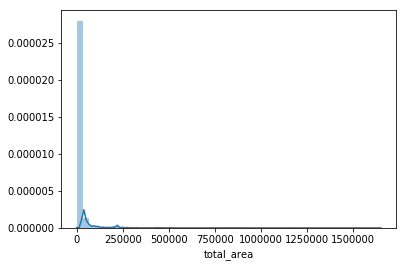

In [83]:
# Verifying the distribution of the variable

sns.distplot(house_df_new['total_area'])
plt.show()

### Inference of distribution

The data has a single distinguishable peak. The histogram shows an abnormaly high number of instances in the total area measures of smaller size, indicating maximum presence of such properties. Also, the data is extremely right skewed indicating presence of outliers.

In [84]:
# Plotting boxplot to detect outliers

data=[(go.Box(x=house_df_new['total_area'],name='total_area',showlegend=True))]
plotly.offline.iplot(data)

### Inference of Suspected outliers

As per boxplot, values > 21942 suggests suspected outliers.

In [85]:
# creating outlier dataframe
total_area_outlier=house_df_new[(house_df_new.total_area>21942)]
total_area_outlier.shape

(2419, 26)

In [230]:
# correlation of total area with price

total_area_outlier['total_area'].corr(house_df_new['price'])

-0.043639054935940266

There are 2419 outlier entries. They have no corelation with price. Hence, they can be removed from the analysis dataframe.

# Outlier Summary

Based on the univariate and bivariate analysis, the following decisions were taken. 

### Outliers to be removed:

1) total_area         (2419 entries)

2) lot_measure15      (2194 entries)

3) room_bed -> Case B (347 entries)

4) lot_measure        (2425 entries)

5) long               (256 entries)

6) coast              (163 entries)

7) condition          (30 entries)

8) yr_renovated       (914 entries)

9) cid                (entire column)



### Outliers decision to be taken based on modelling accuracy:



# Corelation analysis

In [87]:
X=house_scaled_df.drop('price',axis=1)

NameError: name 'house_scaled_df' is not defined

In [ ]:
X_corr=X.corr()

In [ ]:
fig, ax = plt.subplots(figsize=(20,20))   
sns.heatmap(X_corr,annot=True)

## Inference

Iot_measure and total_area are very strongly corelated. Likewise ceiling measure and living measure are highly corelated. As there are strong positive corelations between some of the input variables, we can do a PCA to reduce the dimensions

In [ ]:
# Normalizing the dataframe to evaluate the spread across the elements in a similar fashion

from scipy.stats import zscore

house_scaled_df = house_df_new.apply(zscore)

#convert the numpy array back into a dataframe 

house_scaled_df = pd.DataFrame(house_scaled_df, columns=house_df_new.columns)

#Evaluating the scaled dataframe

house_scaled_df.describe().transpose()

In [ ]:
X.head(5)

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca=PCA(0.95)

In [ ]:
X_pca=pca.fit_transform(X)

In [ ]:
pca.n_components_

In [ ]:
pca.explained_variance_ratio_

To explain a variance of 95% in the dataframe, PCA is employed to transform the base dataset into one with 15 features. 

In [ ]:
house_df_pca=pd.DataFrame(data=X_pca,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15'])

In [ ]:
house_df_pca.shape

In [ ]:
house_df_pca.describe()

# k means clustering

In [ ]:
attributes = house_scaled_df.drop('price',axis=1)

#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
clusters=range(1,20)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(attributes)
    prediction=model.predict(attributes)
    meanDistortions.append(sum(np.min(cdist(attributes, model.cluster_centers_, 'euclidean'), axis=1)) / attributes.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')


In [ ]:
#  K = 4
final_model=KMeans(4)
final_model.fit(attributes)
prediction=final_model.predict(attributes)

#Append the prediction 
house_scaled_df["GROUP"] = prediction
print("Groups Assigned : \n")
house_scaled_df[["price", "GROUP"]].head(5)

In [ ]:
sns.pairplot(house_scaled_df,hue='GROUP',size=4)

In [ ]:
house_scaled_df.groupby(by='GROUP',axis=0).count()

The group 0 and 2 contain similar number of samples, however, in group 3 there is very low number of samples.

There are total 21613 entities. Hence, let's upsample and downsample among the 4 groups to a mean sample size of 5404 samples each.

In [ ]:
conda install -c glemaitre imbalanced-learn

In [ ]:
from imblearn.over_sampling import SMOTE